In [1]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pl


import pickle
import random
import os
import sys

from tqdm import tqdm

import torch.nn as nn
import torch

import plotly.express as px

import itertools

from sklearn.preprocessing import StandardScaler
from scipy.signal import savgol_filter
from sklearn.metrics import pairwise_distances


from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import LocallyLinearEmbedding, SpectralEmbedding, MDS

from sklearn.neighbors import LocalOutlierFactor

from MARBLE import utils, geometry, net, plotting, postprocessing, compare_attractors

2023-03-10 11:50:50.505016: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-10 11:50:50.911686: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-10 11:50:50.911712: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-03-10 11:50:50.981903: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-03-10 11:50:52.214921: W tensorflow/stream_executor/platform/de

## analysing data without vectors or inner products

In [2]:

with open('./outputs/distance_matrices_and_embeddings_20ms_sc0.pkl', 'rb') as handle:
    data = pickle.load(handle)

distance_matrices = data[0]
embeddings = data[1]
timepoints = data[2]
labels = data[3]
sample_inds = data[4]
trial_ids = data[5]

conditions=['DownLeft','Left','UpLeft','Up','UpRight','Right','DownRight']  

In [3]:
len(distance_matrices)

17

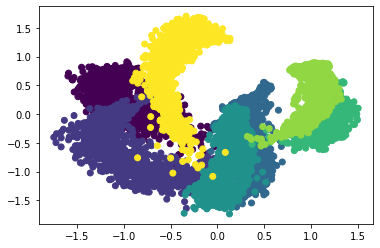

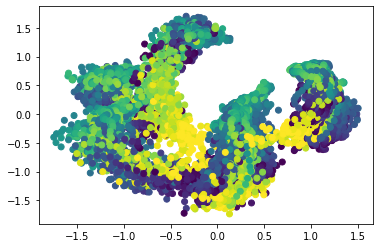

In [4]:
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1],c=labels[-1])

plt.figure()
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1],c=np.hstack(timepoints[-1]))

In [5]:

# Import dependencies
import plotly
import plotly.graph_objs as go

colors = pl.cm.viridis(np.linspace(0,1,7))


# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

d = 14
emb = embeddings[d]
label = labels[d]
time = np.hstack(timepoints[d])
# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb[label==i,0],  
        y=emb[label==i,1],  
        z=emb[label==i,2],  
        mode='markers',
        marker={
            'size': 1,
            'opacity': 1,
            'color':'rgb({},{},{})'.format(colors[i,0],colors[i,1],colors[i,2]),  # set color to an array/list of desired values
        },
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showgrid=False,showline=False),
    yaxis=dict(showgrid=False,showline=False)
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)
plot_figure.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )



# Render the plot.
plotly.offline.iplot(plot_figure)


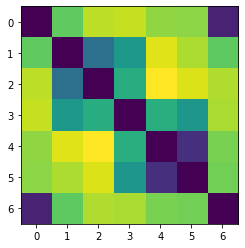

In [6]:
plt.imshow(distance_matrices[0])

# plot lfads embeddings

In [17]:
kinematic_data =  pickle.load(open('../data/kinematics.pkl','rb'))       

conditions=['DownLeft','Left','UpLeft','Up','UpRight','Right','DownRight']  

d = 14
K = kinematic_data[d]


colors = pl.cm.viridis(np.linspace(0,1,7))

In [22]:
lfads_data = [[] for cond in conditions]
all_data = []
for c,cond in enumerate(conditions):   
    for t in kinematic_data[d].keys():
        if kinematic_data[d][t]['condition']==cond:
            meh = kinematic_data[d][t]['lfads_factors']
            lfads_data[c].append(meh)
            all_data.append(meh)

lfads_data = [np.hstack(u) for u in lfads_data]
all_data = np.hstack(all_data)            

pca = PCA(n_components=3)
pca.fit(all_data.T)  



PCA(n_components=3)

In [24]:
emb[0,:].shape

(1015,)

In [25]:
import plotly
import plotly.graph_objs as go

colors = pl.cm.viridis(np.linspace(0,1,7))


# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()


# Configure the trace.
data = []

for i in range(7):
    emb = pca.transform(lfads_data[i].T)
    trace = go.Scatter3d(
        x=emb[:,0],  
        y=emb[:,1],  
        z=emb[:,2],  
        mode='markers',
        marker={
            'size': 1,
            'opacity': 1,
            'color':'rgb({},{},{})'.format(colors[i,0],colors[i,1],colors[i,2]),  # set color to an array/list of desired values
        },
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showgrid=False,showline=False),
    yaxis=dict(showgrid=False,showline=False)
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)
plot_figure.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )



# Render the plot.
plotly.offline.iplot(plot_figure)

### average distance matrix when using distances based on clustering

Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



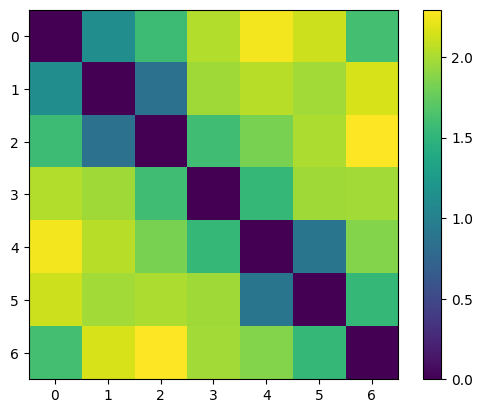

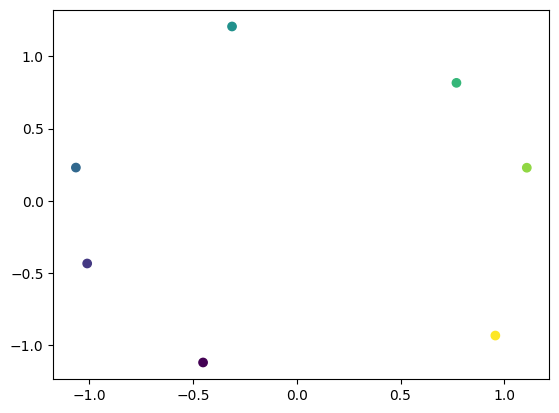

In [14]:
# plot average distance matrix based on clustering
plt.figure()
plt.imshow(np.mean(np.dstack(distance_matrices),2)); plt.colorbar()  

emb_MDS, _ = geometry.embed(np.mean(np.dstack(distance_matrices),2), embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))

## average distance matrix when recomputing distance based on embedding

In [15]:
# compute distance between conditions for each session

distance_matrices = []

for d in range(len(embeddings)):
    
    embedding = embeddings[d]
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])
    
    sub_embeddings = []
    
    for c,cond in enumerate(conditions):
        indexes =  (label==c)
        sub_emb = embedding[indexes].numpy()
        sub_embeddings.append(sub_emb)
            
    
    distances = np.zeros([len(sub_embeddings), len(sub_embeddings)])
    for i in range(len(sub_embeddings)):
        for j in range(len(sub_embeddings)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = pairwise_distances(sub_embeddings[i],sub_embeddings[j]).mean()
                
    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    

Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



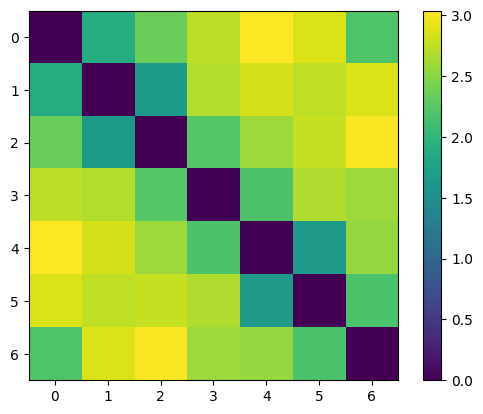

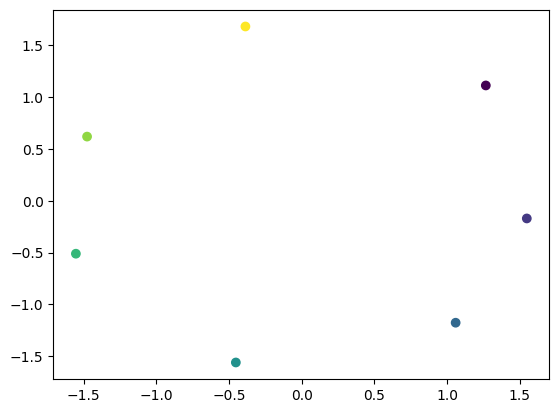

In [16]:
# plot average distance matrix
plt.figure()
plt.imshow(np.mean(np.dstack(distance_matrices),2)); plt.colorbar()  

emb_MDS, _ = geometry.embed(np.mean(np.dstack(distance_matrices),2), embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))

### individual session distances 

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.


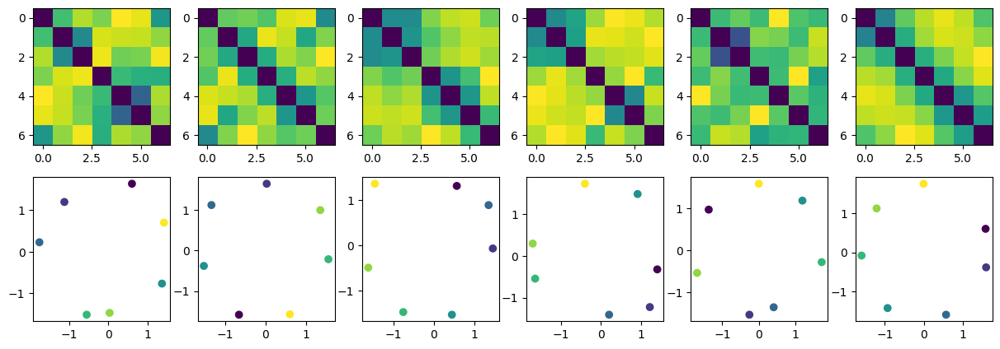

In [17]:

examples = [0,1,2,3,4,5,6,7,8,9]
fig, axs = plt.subplots(2,len(examples),figsize=(15,5))

for i,idx in enumerate(examples):
    axs[0, i].imshow(distance_matrices[idx])
    
    emb_MDS, _ = geometry.embed(distance_matrices[idx], embed_typ = 'MDS')
    axs[1, i].scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))
    


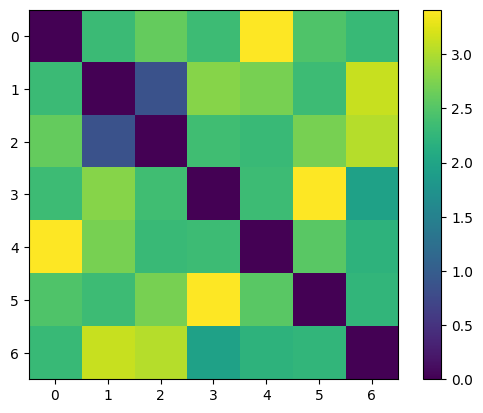

In [11]:
plt.figure()
plt.imshow(distance_matrices[4]); plt.colorbar()  

### averaged across sessions

### Shifting time periods

In [26]:

time_periods = np.linspace(0,33,34)


distance_matrices = []
for d in tqdm(range(len(embeddings))):
    
    embedding = embeddings[d]
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])
    
    sub_embeddings = []
    
    for c,cond in enumerate(conditions):
        for period  in time_periods:
            indexes =  (label==c) * (times==period) #* (times>=period[0]) * (times<period[1])
            sub_emb = embedding[indexes].numpy()
            
            sub_embeddings.append(sub_emb)
            
    
    distances = np.zeros([len(sub_embeddings), len(sub_embeddings)])
    for i in range(len(sub_embeddings)):
        for j in range(len(sub_embeddings)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = pairwise_distances(sub_embeddings[i],sub_embeddings[j]).mean()
    
    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    
            
            

100%|███████████████████████████████████████████| 17/17 [02:32<00:00,  8.95s/it]


In [27]:
distance_matrix = np.mean(np.dstack(distance_matrices),2)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


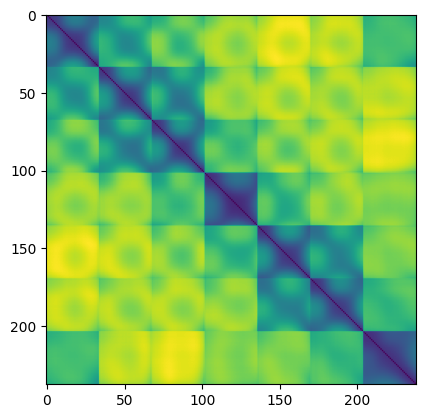

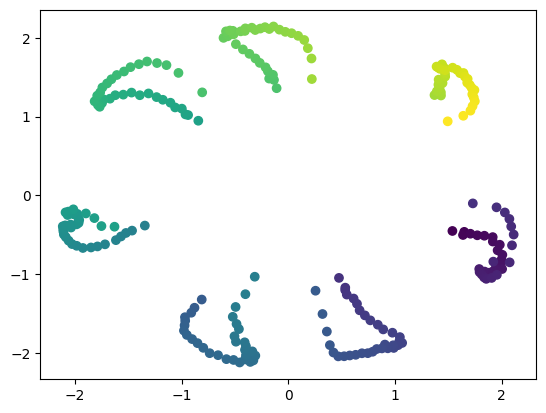

In [28]:
plt.figure()
plt.imshow(distance_matrix)

emb_MDS, _ = geometry.embed(distance_matrix, embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,distance_matrix.shape[0]-1,distance_matrix.shape[0]))



In [29]:
emb_MDS, _ = geometry.embed(distance_matrix, dim_emb=3, embed_typ = 'MDS')
emb_MDS.shape

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


(238, 3)

In [30]:

# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()


emb_MDS, _ = geometry.embed(distance_matrix, dim_emb=3, embed_typ = 'MDS')


# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb_MDS[i*34:i*34+34,0],  
        y=emb_MDS[i*34:i*34+34,1],  
        z=emb_MDS[i*34:i*34+34,2],  
        mode='markers',
        marker={
            'size': np.linspace(1,34,34),
            'opacity': 0.8,
        }
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


### Increasing time periods



In [22]:
from scipy.spatial.distance import squareform, pdist

time_periods = np.arange(0,33,5)


distance_matrices = []
for d in tqdm(range(len(embeddings))):
    
    embedding = embeddings[d].numpy()
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])

    sub_indexes = []

    full_distance_matrix = squareform(pdist(embedding))

    for c,cond in enumerate(conditions):
        for period  in time_periods:
            indexes =  (label==c) * (times>=period) 
            sub_indexes.append(indexes)

    distances = np.zeros([len(sub_indexes), len(sub_indexes)])
    for i in tqdm(range(len(sub_indexes))):
        for j in range(len(sub_indexes)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = full_distance_matrix[sub_indexes[i],:][:, sub_indexes[j]].mean()

    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    
            
            

 94%|████████████████████████████████████████▎  | 46/49 [00:40<00:02,  1.09it/s]


 88%|█████████████████████████████████████▋     | 43/49 [00:08<00:01,  5.56it/s]


 84%|███████████████████████████████████▉       | 41/49 [00:38<00:07,  1.14it/s]


  2%|▉                                           | 1/49 [00:00<00:41,  1.15it/s]


100%|███████████████████████████████████████████| 17/17 [09:29<00:00, 33.53s/it]


In [23]:
distance_matrix = np.mean(np.dstack(distance_matrices),2)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


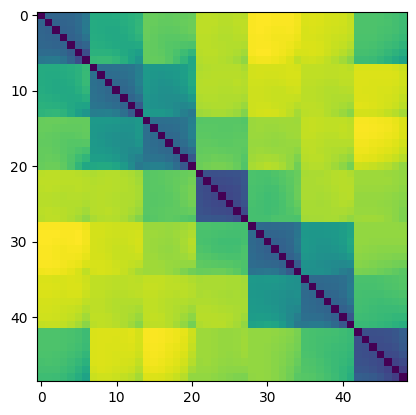

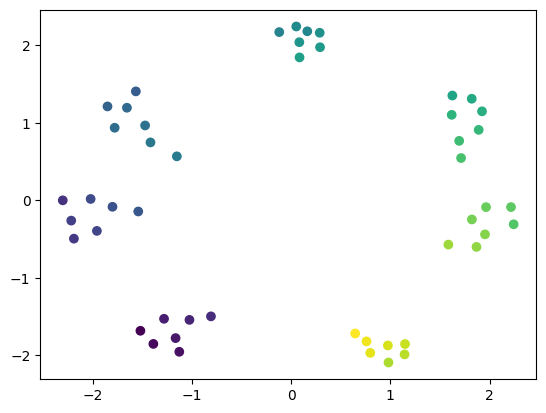

In [24]:
plt.figure()
plt.imshow(distance_matrix)

emb_MDS, _ = geometry.embed(distance_matrix, embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,distance_matrix.shape[0]-1,distance_matrix.shape[0]))

In [25]:

# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()


emb_MDS, _ = geometry.embed(distance_matrix, dim_emb=3, embed_typ = 'MDS')


# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb_MDS[i*7:i*7+7,0],  
        y=emb_MDS[i*7:i*7+7,1],  
        z=emb_MDS[i*7:i*7+7,2],  
        mode='markers',
        marker={
            'size': np.linspace(1,7,7)*2,
            'opacity': 0.8,
        }
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.
